Jeyner Arango 201106

Oscar Méndez 20402

# Lista 04

In [46]:
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
import seaborn as sns
import time
import itertools
import io

## Ejercicio 1

### Algoritmo de descenso gradiante naïve con dirección de descenso aleatoria

In [2]:
def gradient_descent_naive(f, df, x0, alpha, max_iterations=1000, tolerance=1e-4):
    start = time.time()
    
    x = x0
    iter = 0
    val = 'NO'
    best_x = x
    f_iter_seq = [x]
    f_x_iter_seq = [f(x)]
    error_seq = [0]

    while iter < max_iterations:
        gradient = df(x)
        normalized_gradient = df(x) / np.linalg.norm(df(x))
        random_direction = np.random.rand(*x.shape)  # Generar una dirección de descenso aleatoria
        normalized_random_direction = random_direction / np.linalg.norm(random_direction)

        # Verificar si el ángulo entre normalized_gradient y normalized_random_direction está en [0, pi/2] radianes
        if 0 <= np.arccos(np.dot(normalized_gradient, normalized_random_direction) / (np.linalg.norm(normalized_gradient) * \
                                                                                      np.linalg.norm(normalized_random_direction))) <= np.pi/2:
            # Si cumple baja en esta dirección
            descent_direction = -normalized_random_direction
        else:
            # Usar un submultiplo de la dirección del gradiente si no cumple con la condición
            t = random.random()
            descent_direction = -t * normalized_gradient  

        x_next = x + alpha * descent_direction
        f_iter_seq.append(x_next)
        f_x_iter_seq.append(f(x_next))
        error_seq.append(np.linalg.norm(gradient))

        if np.linalg.norm(df(x_next)) < np.linalg.norm(df(x)):
            best_x = x_next

        if np.linalg.norm(gradient) < tolerance:
            best_x = x_next
            val = 'SÍ'
            break

        x = x_next
        iter += 1

    print('Número de iteraciones = ' + str(iter), '\nEl algoritmo ' + val + ' convergió')
    print('Vector seleccionado: ' + str(best_x))
    print('Valor mínimo alcanzado: ' + str(f(best_x)))
    print('Error mínimo alcanzado: ' + str(error_seq[-1]))
    return best_x, f_iter_seq, f_x_iter_seq, error_seq, time.time() - start

### Algoritmo de descenso máximo naïve

In [3]:
def gradient_descent_steepest(f, df, x0, alpha, max_iterations=1000, tolerance=1e-4):
    start = time.time()
    
    x = x0
    iter = 0
    val = 'NO'
    best_x = x
    f_iter_seq= [x]
    f_x_iter_seq = [f(x)]
    error_seq = [0]

    while iter < max_iterations:
        gradient = df(x)
        normalized_gradient = df(x) / np.linalg.norm(df(x))
        descent_direction = -normalized_gradient
        x_next = x + alpha * descent_direction
        f_iter_seq.append(x_next)
        f_x_iter_seq.append(f(x_next))
        error_seq.append(np.linalg.norm(gradient))
        
        if np.linalg.norm(df(x_next)) < np.linalg.norm(df(x)):
            best_x = x_next
            
        if np.linalg.norm(gradient) < tolerance:
            best_x = x_next
            val = 'SÍ'
            break

        x = x_next
        iter += 1
 
    print('Número de iteraciones = '+str(iter), '\nEl algoritmo ' + val + ' convergió')
    print('Vector seleccionado: '+str(best_x))
    print('Valor mínimo alcanzado: ' + str(f(best_x)))
    print('Error mínimo alcanzado: ' + str(error_seq[-1]))
    return best_x, f_iter_seq, f_x_iter_seq, error_seq, time.time() - start

### Algoritmo de descenso con Backtracking

In [4]:
def backtracking_line_search(f, df, x_k, d_k, alpha_0=1, c1=1e-4, c2=0.9, rho=0.1):
    if not (0 < c1 < 1):
        print('Error: La constante c1 debe estar entre 0 y 1')
        return None

    if not (0 < c2 < 1):
        print('Error: La constante c2 debe estar entre 0 y 1')
        return None

    if not (0 < rho < 1):
        print('Error: La constante rho debe estar entre 0 y 1')
        return None

    alpha = alpha_0
    conditions_met = True  # Inicializamos la variable de control de las condiciones

    while conditions_met:
        x_next = x_k + alpha * d_k
        lhs_c1 = f(x_next)
        rhs_c1 = f(x_k) + c1 * alpha * np.dot(df(x_k), d_k)
        lhs_c2 = c2 * abs(np.dot(df(x_k), d_k))
        rhs_c2 = abs(np.dot(df(x_next), d_k))

        if lhs_c1 <= rhs_c1 and lhs_c2 <= rhs_c2:
            return alpha

        alpha = rho * alpha
        conditions_met = False  # Cambiamos la variable de control para salir del bucle

    return alpha  # Devolvemos el último valor de alpha cuando las condiciones ya no se cumplen
    
def gradient_descent_with_backtracking(f, df, x0, alpha, c1, c2, rho, max_iterations=1000, tolerance=1e-4):
    start = time.time()
    
    x = x0
    iter = 0
    val = 'NO'
    best_x = x
    f_iter_seq = [x]
    f_x_iter_seq = [f(x)]
    error_seq = [np.linalg.norm(df(x))]

    while iter < max_iterations:
        gradient = df(x)
        d_k = -gradient  # Dirección de descenso: opuesta al gradiente

        # Utilizar Backtracking Line Search para encontrar el paso alpha_k
        alpha_k = backtracking_line_search(f, df, x, d_k, alpha, c1, c2, rho)

        x_next = x + alpha_k * d_k
        f_iter_seq.append(x_next)
        f_x_iter_seq.append(f(x_next))
        error_seq.append(np.linalg.norm(gradient))

        if np.linalg.norm(df(x_next)) < tolerance:
            best_x = x_next
            val = 'SÍ'
            break

        x = x_next
        iter += 1
        
    print('Número de iteraciones = ' + str(iter), '\nEl algoritmo ' + val + ' convergió')
    print('Vector seleccionado: ' + str(best_x))
    print('Valor mínimo alcanzado: ' + str(f(best_x)))
    print('Error mínimo alcanzado: ' + str(error_seq[-1]))

    return best_x, f_iter_seq, f_x_iter_seq, error_seq, time.time() - start

### Algoritmo de descenso de Newton, con Hessiano aproximado

In [5]:
def isPSD(A):
    autovalores, autovectores = np.linalg.eig(A)
    return all(autovalores > 0)

def nearPSD(A, epsilon=1e-6):
    if isPSD(A):
        return A

    if not (A == A.T).all():
        raise ValueError("La matriz no es simétrica.")

    autovalores, autovectores = np.linalg.eigh(A)
    # Si un autovalor es negativo, devolver el epsilon
    autovalores_positivos = np.maximum(autovalores, epsilon)
    # Reconstruir A haciéndolo positivo definida
    A_positiva_definida = autovectores.dot(np.diag(autovalores_positivos)).dot(autovectores.T)

    return A_positiva_definida

In [6]:
def gradient_descent_with_approximate_hessian(f, df, d2f, x0, max_iterations=1000, tolerance=1e-4):
    start = time.time()
    
    x = x0
    iter = 0
    val = 'NO'
    best_x = x
    f_iter_seq = [x]
    f_x_iter_seq = [f(x)]
    error_seq = [np.linalg.norm(df(x))]

    while iter < max_iterations:
        gradient = df(x)
        # Dirección de descenso opuesta al gradiente
        d_k = -gradient
        
        # Comprobar si la matriz Hessiana es positivamente definida usando la función nearPSD
        hessian = d2f(x)
        if not isPSD(hessian):
            # Aproximación de Hessiano positivamente definida (puede requerir ajustes)
            hessian = nearPSD(hessian)

        # Calcular alpha_k
        numerador = np.dot(gradient, gradient)
        denominador = np.dot(gradient, np.dot(hessian, gradient))
        alpha_k = numerador / denominador

        x_next = x + alpha_k * d_k
        f_iter_seq.append(x_next)
        f_x_iter_seq.append(f(x_next))
        error_seq.append(np.linalg.norm(gradient))

        if np.linalg.norm(df(x_next)) < tolerance:
            best_x = x_next
            val = 'SÍ'
            break

        x = x_next
        iter += 1

    print('Número de iteraciones = ' + str(iter), '\nEl algoritmo ' + val + ' convergió')
    print('Vector seleccionado: ' + str(best_x))
    print('Valor mínimo alcanzado: ' + str(f(best_x)))
    print('Error mínimo alcanzado: ' + str(error_seq[-1]))

    return best_x, f_iter_seq, f_x_iter_seq, error_seq, time.time() - start

### Algoritmo de descenso de Newton, con Hessiano exacto

In [7]:
def gradient_descent_with_exact_hessian(f, df, ddf, x0, alpha=1, max_iterations=1000, tolerance=1e-4):
    start = time.time()
    
    x = x0
    iter = 0
    val = 'NO'
    best_x = x
    f_iter_seq = [x]
    f_x_iter_seq = [f(x)]
    error_seq = [np.linalg.norm(df(x))]

    while iter < max_iterations:
        gradient = df(x)

        # Calcular la dirección de descenso utilizando el Hessiano exacto
        try:
            hessian_inv = np.linalg.inv(ddf(x))
        except np.linalg.LinAlgError:
            raise ValueError("No es posible computar debido a que la hessiana no es positivo-definida")

        d_k = -np.dot(hessian_inv, gradient)

        x_next = x + alpha * d_k
        f_iter_seq.append(x_next)
        f_x_iter_seq.append(f(x_next))
        error_seq.append(np.linalg.norm(gradient))

        if np.linalg.norm(df(x_next)) < tolerance:
            best_x = x_next
            val = 'SÍ'
            break

        x = x_next
        iter += 1

    print('Número de iteraciones = ' + str(iter), '\nEl algoritmo ' + val + ' convergió')
    print('Vector seleccionado: ' + str(best_x))
    print('Valor mínimo alcanzado: ' + str(f(best_x)))
    print('Error mínimo alcanzado: ' + str(error_seq[-1]))
    
    return best_x, f_iter_seq, f_x_iter_seq, error_seq, time.time() - start

### Algoritmo de gradiente conjugado Fletcher-Reeves

In [8]:
def conjugate_gradient_fletcher_reeves(f, df, x0, max_iterations=1000, tolerance=1e-4):
    start = time.time()

    x = x0
    iter = 0
    val = 'NO'
    best_x = x
    f_iter_seq = [x]
    f_x_iter_seq = [f(x)]
    error_seq = [np.linalg.norm(df(x))]

    gradient_k = df(x)
    d_k = -gradient_k

    while iter < max_iterations:
        alpha_k = np.dot(gradient_k, gradient_k) / np.dot(d_k, np.dot(df(x), d_k))

        x_next = x + alpha_k * d_k
        f_iter_seq.append(x_next)
        f_x_iter_seq.append(f(x_next))
        error_seq.append(np.linalg.norm(df(x_next)))

        beta_k = np.dot(df(x_next), df(x_next)) / np.dot(gradient_k, gradient_k)
        gradient_k = df(x_next)
        d_k = -gradient_k + beta_k * d_k

        if np.linalg.norm(df(x_next)) < tolerance:
            best_x = x_next
            val = 'SÍ'
            break

        x = x_next
        iter += 1

    print('Número de iteraciones = ' + str(iter), '\nEl algoritmo ' + val + ' convergió')
    print('Vector seleccionado: ' + str(best_x))
    print('Valor mínimo alcanzado: ' + str(f(best_x)))
    print('Error mínimo alcanzado: ' + str(error_seq[-1]))

    return best_x, f_iter_seq, f_x_iter_seq, error_seq, time.time() - start

### Algoritmo Quasi-Newton BFGS

In [9]:
def quasi_newton_bfgs(f, df, x0, max_iterations=1000, tolerance=1e-4):
    start = time.time()

    x = x0
    iter = 0
    val = 'NO'
    best_x = x
    f_iter_seq = [x]
    f_x_iter_seq = [f(x)]
    error_seq = [np.linalg.norm(df(x))]

    H_k = np.eye(len(x))  # Initial approximation to the Hessian matrix

    while iter < max_iterations:
        gradient_k = df(x)

        # Compute the search direction
        d_k = -np.dot(H_k, gradient_k)

        # Line search to find the step size
        alpha_k = 1.0
        while f(x + alpha_k * d_k) > f(x) + 1e-4 * alpha_k * np.dot(gradient_k, d_k):
            alpha_k *= 0.5

        x_next = x + alpha_k * d_k
        s_k = x_next - x
        y_k = df(x_next) - gradient_k

        # Update the Hessian approximation using the BFGS formula
        rho_k = 1.0 / np.dot(y_k, s_k)
        H_k = (np.eye(len(x)) - rho_k * np.outer(s_k, y_k)) @ H_k @ (np.eye(len(x)) - rho_k * np.outer(y_k, s_k)) + rho_k * np.outer(s_k, s_k)

        f_iter_seq.append(x_next)
        f_x_iter_seq.append(f(x_next))
        error_seq.append(np.linalg.norm(df(x_next)))

        if np.linalg.norm(df(x_next)) < tolerance:
            best_x = x_next
            val = 'SÍ'
            break

        x = x_next
        iter += 1

    print('Número de iteraciones = ' + str(iter), '\nEl algoritmo ' + val + ' convergió')
    print('Vector seleccionado: ' + str(best_x))
    print('Valor mínimo alcanzado: ' + str(f(best_x)))
    print('Error mínimo alcanzado: ' + str(error_seq[-1]))

    return best_x, f_iter_seq, f_x_iter_seq, error_seq, time.time() - start

## Ejercicio 2

### Funciones y parámetros

In [10]:
def plot_function_2d(f, x_range=(0,1), y_range=(0, 1), num_points=100, levels=20, figsize=(8, 8), show=True, points=None, title=None):
    x = np.linspace(x_range[0], x_range[1], num_points)
    y = np.linspace(y_range[0], y_range[1], num_points)
    X, Y = np.meshgrid(x, y)
    Z = np.zeros_like(X)

    for i in range(len(x)):
        for j in range(len(y)):
            Z[i, j] = f(np.array([X[i, j], Y[i, j]]))

    fig=plt.figure(figsize=figsize)
    plt.contour(X, Y, Z, levels=levels)
    plt.colorbar()

    if title is not None:
        plt.title(title)
        
    if points is not None:
        x_points = [point[0] for point in points]
        y_points = [point[1] for point in points]
        plt.plot(x_points, y_points, 'ro', markersize=0.5, label='Optimization Path')
        plt.legend()

    if show:
        plt.show(fig)

In [11]:
def plot_function_10d(f, x_range=(-2, 2), y_range=(-2, 2), num_points=100, levels=20, figsize=(15, 20), show=True, points=None, title=None):
    pairs = [(i, j) for i in range(10) for j in range(i+1, 10)]

    fig, axes = plt.subplots(9, 5, figsize=figsize)
    fig.subplots_adjust(wspace=0.5, hspace=0.5)
    axes = axes.ravel()

    for i, (dim1, dim2) in enumerate(pairs):
        x = np.linspace(x_range[0], x_range[1], num_points)
        y = np.linspace(y_range[0], y_range[1], num_points)
        X, Y = np.meshgrid(x, y)
        Z = np.zeros_like(X)

        for j in range(len(x)):
            for k in range(len(y)):
                point = np.zeros(10)
                point[dim1] = x[j]
                point[dim2] = y[k]
                Z[j, k] = f(point)

        axes[i].contour(X, Y, Z, levels=levels)
        axes[i].set_title(f'Dim {dim1} vs Dim {dim2}')

        if len(points) > 0:
            x_points = [point[dim1] for point in points]
            y_points = [point[dim2] for point in points]
            axes[i].plot(x_points, y_points, 'ro', markersize=0.5)
    plt.suptitle(title, fontsize=16, y=0.9)
    
    if show:
        plt.show()

In [12]:
def f_1(x):
    # Función: f(x,y) = x^4 + y^4 - 4xy + 0.5y + 1
    return x[0]**4 + x[1]**4 -4*x[0]*x[1] + 0.5*x[1]+1  

def df_1(x):
    df_1dx = 4*x[0]**3-4*x[1]
    df_1dy = 4*x[1]**3-4*x[0] + 0.5
    return np.array([df_1dx, df_1dy])

def ddf_1(x):
    ddf_1ddx = 12*x[0]**2-4
    ddf_1dxdy = -4
    ddf_1ddy = 12*x[1]**2
    return np.array([[ddf_1ddx, ddf_1dxdy],[ddf_1dxdy, ddf_1ddy]])

def f_2(x):
    # funcion: f(x1,x2) = 100(x2-x1²)² + (1-x1)²
    return 100*((x[1]-x[0]**2)**2) + (1- x[0])**2

def df_2(x):
    df_2dx1 = -400*x[0]*(x[1]-x[0]**2)-2*(1-x[0])
    df_2dx2 = 200*(x[1]-x[0]**2)
    return np.array([df_2dx1, df_2dx2])

def ddf_2(x):
    ddf_2ddx1 = 1200*x[0]**2-400*x[1]+2
    ddf_2dx1dx2 = -400*x[0]
    ddf_2ddx2 = 200
    return np.array([[ddf_2ddx1, ddf_2dx1dx2],[ddf_2dx1dx2, ddf_2ddx2]])

def f_3(x):
    n = len(x)
    total = []
    for i in range (n-1):
        fx = 100*((x[i+1] - x[i]**2)**2) + (1-x[i])**2
        total.append(fx)
    return sum(total)

def df_3(x):
    n = len(x)
    jacobian = []

    for i in range(n-1):
        dfdx = 200 * (x[i + 1] - x[i] ** 2) * (-2 * x[i]) - 2 * (1 - x[i])
        jacobian.append(dfdx)

    x_final = 200 * (x[-1] - x[-2]**2)
    jacobian.append(x_final)
    
    return np.array(jacobian)
    
def ddf_3(x):
    n = len(x)
    hessian = np.zeros((n, n))

    for i in range(n):
        # Diagonal
        hessian[i, i] = 1200 * x[i]**2 - 400 * x[(i + 1) % n] + 2

        # Off-diagonal +/- 1
        hessian[i, (i + 1) % n] = -400 * x[i]
        hessian[(i + 1) % n, i] = -400 * x[i]

    hessian[-1,-1] = 200
    return hessian

In [13]:
f_1_initial_guess = np.array([-3.1, 3.1])
f_1_min_abs = [-1.01463,-1.04453]
f_1_step_rate = 0.01
f_1_max_iterations = 50000
f_1_tolerance = 1e-4

In [14]:
f_2_initial_guess = np.array([1.2, 1.0])
f_2_min_abs = np.array([1.0, 1.0])
f_2_step_rate = 0.01
f_2_max_iterations = 100000
f_2_tolerance = 1e-2

In [15]:
f_3_initial_guess = np.array([1.2, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.2, 1.0])
f_3_min_abs = np.array([1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0,])
f_3_step_rate = 0.001
f_3_max_iterations = 100000
f_3_tolerance = 1e-3

### Algoritmo de descenso gradiante naïve con dirección de descenso aleatoria

#### Funcion a)

In [16]:
results_1_a = gradient_descent_naive(f_1, df_1, f_1_initial_guess, f_1_step_rate, f_1_max_iterations, f_1_tolerance)

Número de iteraciones = 50000 
El algoritmo NO convergió
Vector seleccionado: [-1.01612454 -1.04365613]
Valor mínimo alcanzado: -1.5112953751686926
Error mínimo alcanzado: 0.028067912544364134


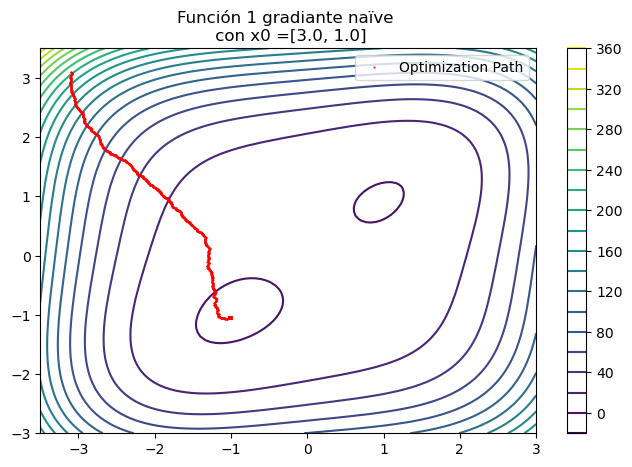

In [17]:
plot_function_2d(f_1, x_range=(-3.5, 3), y_range=(-3, 3.5), figsize=(8,5), show=True, points=results_1_a[1], title='Función 1 gradiante naïve \n con x0 =[3.0, 1.0]')

#### Funcion b)

In [18]:
results_1_b = gradient_descent_naive(f_2, df_2, f_2_initial_guess, 0.0001, f_2_max_iterations, f_2_tolerance)

Número de iteraciones = 7164 
El algoritmo SÍ convergió
Vector seleccionado: [0.98914724 0.9783708 ]
Valor mínimo alcanzado: 0.00011795430884102002
Error mínimo alcanzado: 0.009814730608189404


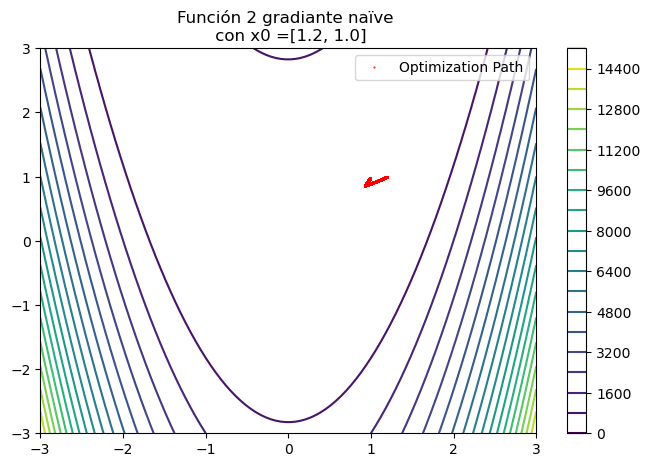

In [19]:
plot_function_2d(f_2, x_range=(-3, 3), y_range=(-3, 3), figsize=(8,5), show=True, points=results_1_b[1], title='Función 2 gradiante naïve \n con x0 =[1.2, 1.0]')

#### Funcion c)

In [20]:
results_1_c = gradient_descent_naive(f_3, df_3, f_3_initial_guess, 0.00001, f_3_max_iterations, f_3_tolerance)

Número de iteraciones = 88605 
El algoritmo SÍ convergió
Vector seleccionado: [0.9999961  0.99999225 0.99998455 0.99996922 0.99993857 0.99987706
 0.99975367 0.99950641 0.99901109 0.99801921]
Valor mínimo alcanzado: 1.3044722679263299e-06
Error mínimo alcanzado: 0.0009617295055341884


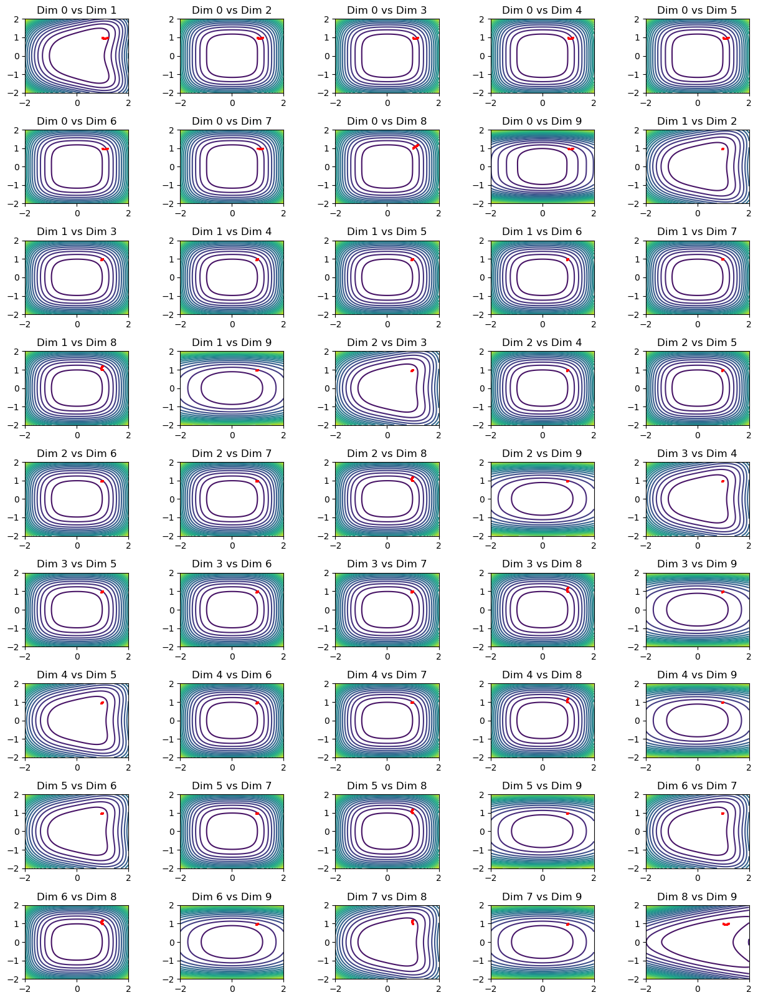

In [21]:
plot_function_10d(f_3, points=results_1_c[1])

### Algoritmo de descenso máximo naïve

#### Funcion a)

In [22]:
results_2_a = gradient_descent_steepest(f=f_1,df=df_1, x0=f_1_initial_guess, alpha=0.001,
                                        max_iterations=f_1_max_iterations, tolerance=f_1_tolerance)

Número de iteraciones = 50000 
El algoritmo NO convergió
Vector seleccionado: [-1.01483876 -1.04429928]
Valor mínimo alcanzado: -1.5113186303036397
Error mínimo alcanzado: 0.01150932003018335


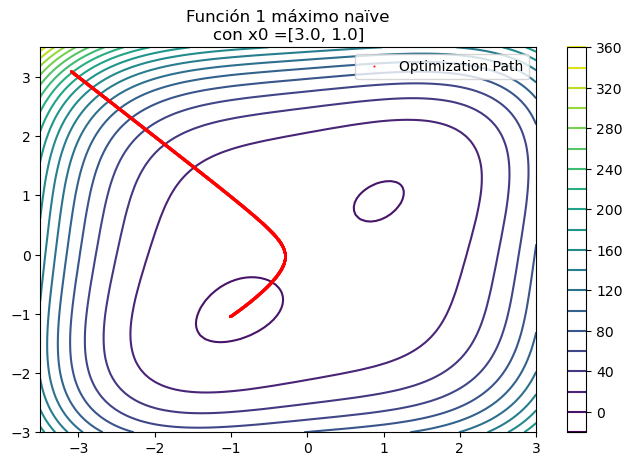

In [23]:
plot_function_2d(f_1, x_range=(-3.5, 3), y_range=(-3, 3.5), figsize=(8,5), show=True, points=results_2_a[1], title='Función 1 máximo naïve\ncon x0 =[3.0, 1.0]')

#### Funcion b)

In [24]:
results_2_b = gradient_descent_steepest(f_2, df_2, f_2_initial_guess, alpha=0.00001,
                                        max_iterations=f_2_max_iterations, tolerance=f_2_tolerance)

Número de iteraciones = 23580 
El algoritmo SÍ convergió
Vector seleccionado: [1.01127417 1.02272026]
Valor mínimo alcanzado: 0.00012730770891951817
Error mínimo alcanzado: 0.009997577825680953


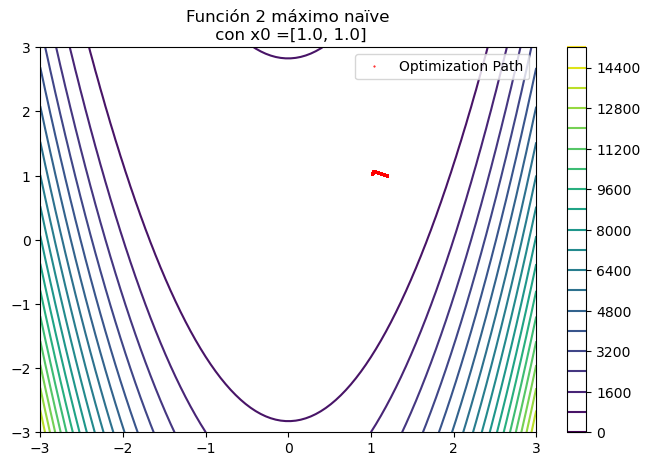

In [25]:
plot_function_2d(f_2, x_range=(-3, 3), y_range=(-3, 3), figsize=(8,5), show=True, points=results_2_b[1], title='Función 2 máximo naïve\n con x0 =[1.0, 1.0]')

#### Funcion c)

In [26]:
results_2_c = gradient_descent_steepest(f_3, df_3, f_3_initial_guess, 0.0001,
                                        f_3_max_iterations, tolerance=f_3_tolerance)

Número de iteraciones = 100000 
El algoritmo NO convergió
Vector seleccionado: [1.00004322 0.99997843 1.00001076 0.99999463 1.00000268 0.99999866
 1.00000067 0.99999967 1.00000017 0.99999992]
Valor mínimo alcanzado: 1.5562240651991082e-06
Error mínimo alcanzado: 0.04996084741572333


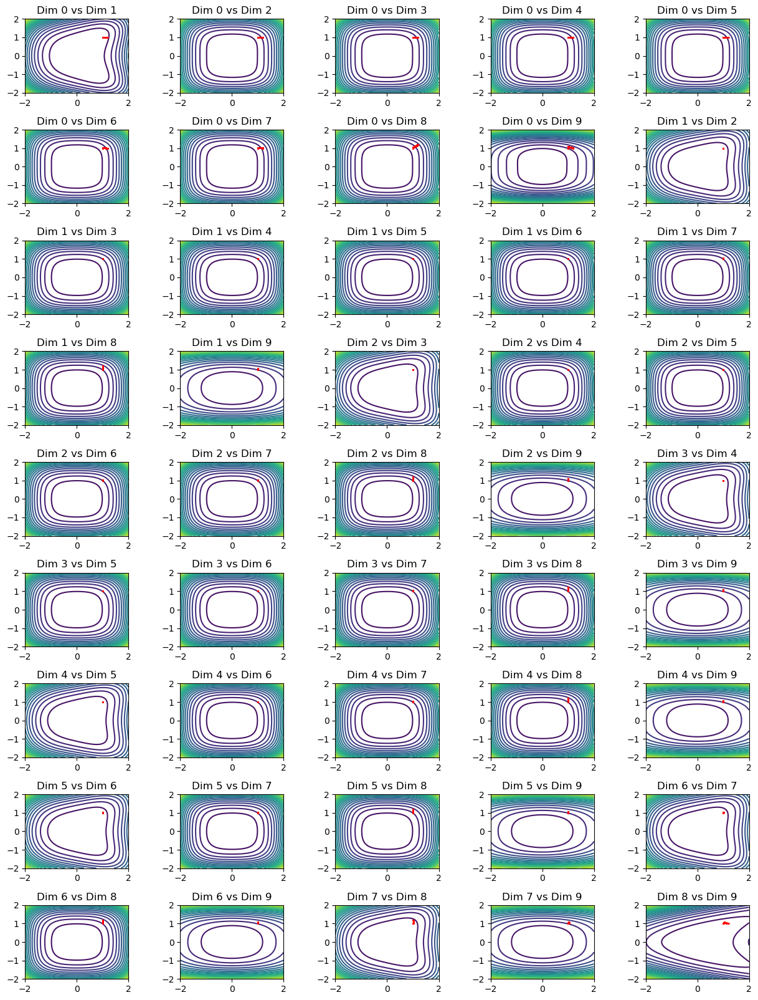

In [27]:
plot_function_10d(f_3, points=results_2_c[1])

### Algoritmo de descenso con Backtracking

#### Funcion a)

In [28]:
results_3_a = gradient_descent_with_backtracking(f_1, df_1, f_1_initial_guess, alpha = f_1_step_rate, 
                                                         c1=1e-4, c2=0.9,rho=0.1, 
                                                         max_iterations=f_1_max_iterations, tolerance=f_1_tolerance)

Número de iteraciones = 306 
El algoritmo SÍ convergió
Vector seleccionado: [-1.01462022 -1.04452293]
Valor mínimo alcanzado: -1.5113194471831006
Error mínimo alcanzado: 0.00010607023417791292


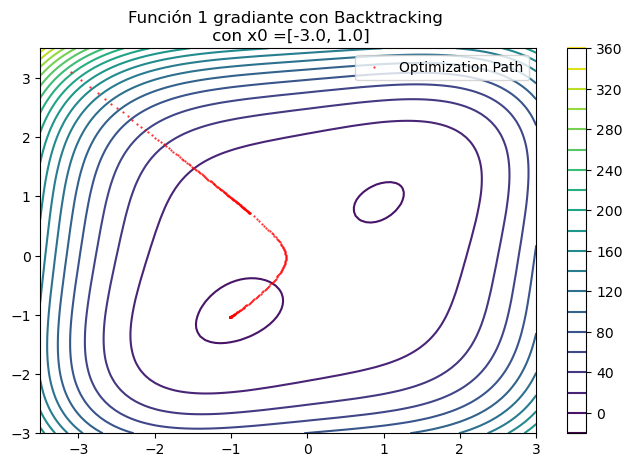

In [29]:
plot_function_2d(f_1, x_range=(-3.5, 3), y_range=(-3, 3.5), figsize=(8,5), show=True, 
                 points=results_3_a[1], title='Función 1 gradiante con Backtracking \n con x0 =[-3.0, 1.0]')

#### Funcion b)

In [30]:
results_3_b = gradient_descent_with_backtracking(f_2, df_2, f_2_initial_guess, f_2_step_rate, c1=1e-4, c2=0.9,rho=0.1,
                                                         max_iterations=f_2_max_iterations, tolerance=f_2_tolerance)

Número de iteraciones = 425 
El algoritmo SÍ convergió
Vector seleccionado: [1.01126454 1.02270006]
Valor mínimo alcanzado: 0.00012708425583048252
Error mínimo alcanzado: 0.010024013979395115


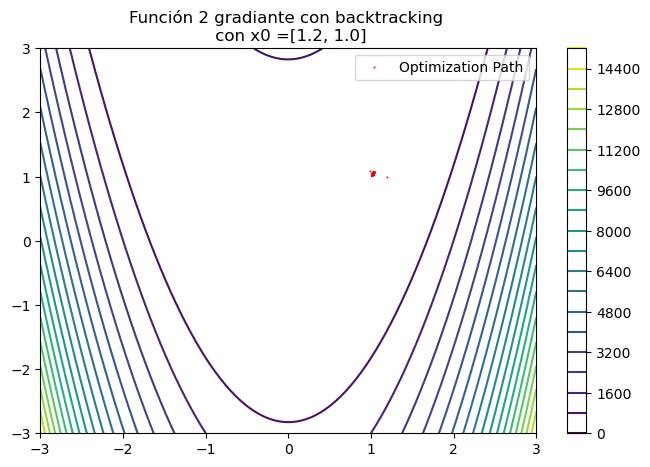

In [31]:
plot_function_2d(f_2, x_range=(-3, 3), y_range=(-3, 3), figsize=(8,5), show=True, 
                 points=results_3_b[1], title='Función 2 gradiante con backtracking \n con x0 =[1.2, 1.0]')

#### Funcion c)

In [32]:
results_3_c = gradient_descent_with_backtracking(f_3, df_3, f_3_initial_guess, f_3_step_rate,  c1=1e-4, c2=0.9,rho=0.1,
                                                         max_iterations=f_3_max_iterations, tolerance=f_3_tolerance)

Número de iteraciones = 9034 
El algoritmo SÍ convergió
Vector seleccionado: [1.00000416 1.00000834 1.00001672 1.00003351 1.00006716 1.00013459
 1.00026974 1.00054063 1.00108372 1.00217295]
Valor mínimo alcanzado: 1.5661059206534086e-06
Error mínimo alcanzado: 0.00100027096625888


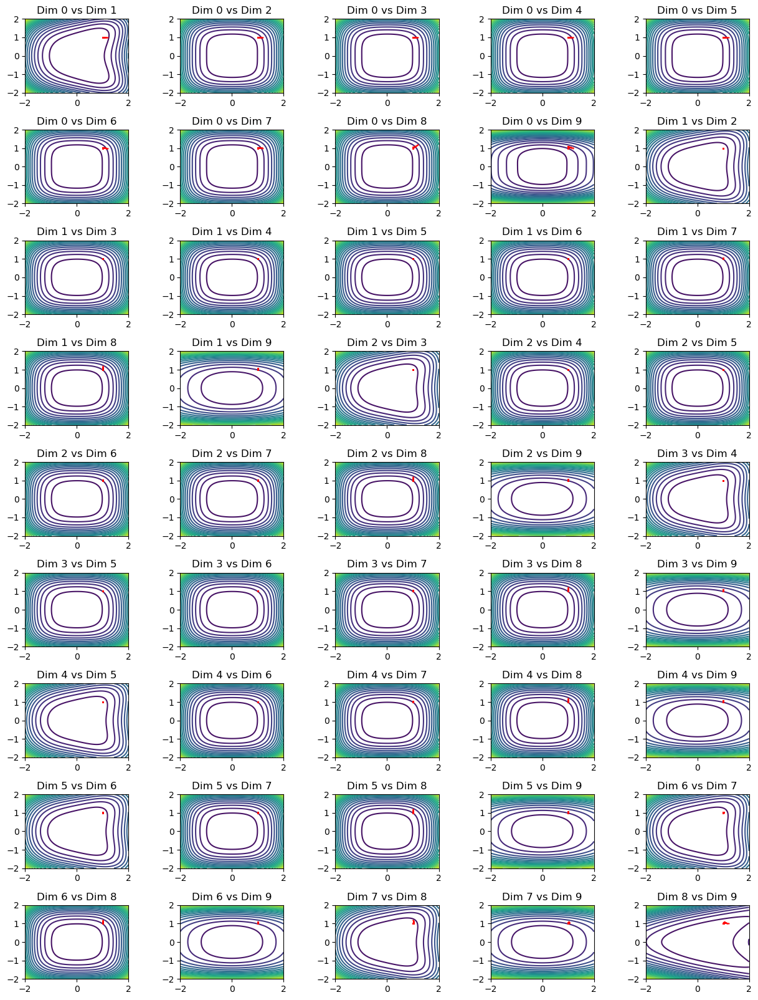

In [33]:
plot_function_10d(f_3, points=results_3_c[1])

### Algoritmo de descenso de Newton, con Hessiano aproximado

#### Funcion a)

In [34]:
results_4_a = gradient_descent_with_approximate_hessian(f_1, df_1, ddf_1, f_1_initial_guess, 
                                                         max_iterations=f_1_max_iterations, tolerance=f_1_tolerance)

Número de iteraciones = 17 
El algoritmo SÍ convergió
Vector seleccionado: [-1.01462385 -1.0445284 ]
Valor mínimo alcanzado: -1.5113194476018346
Error mínimo alcanzado: 0.0002888678361917563


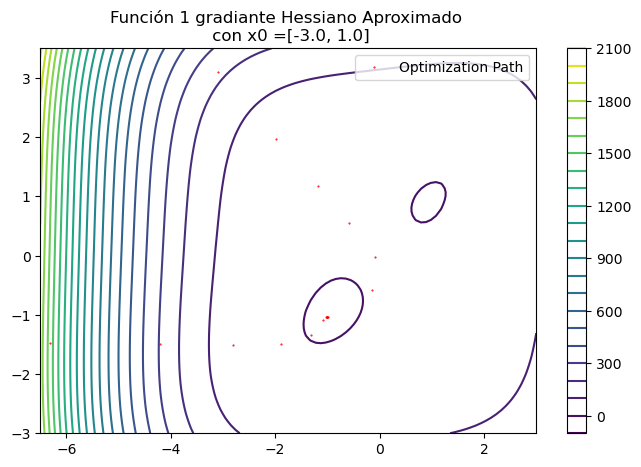

In [35]:
plot_function_2d(f_1, x_range=(-6.5, 3), y_range=(-3, 3.5), figsize=(8,5), show=True, 
                 points=results_4_a[1], title='Función 1 gradiante Hessiano Aproximado \n con x0 =[-3.0, 1.0]')

#### Funcion b)

In [36]:
results_4_b = gradient_descent_with_approximate_hessian(f_2, df_2, ddf_2, f_2_initial_guess,
                                                         max_iterations=f_2_max_iterations, tolerance=f_2_tolerance)

Número de iteraciones = 6 
El algoritmo SÍ convergió
Vector seleccionado: [1.01115155 1.02246988]
Valor mínimo alcanzado: 0.0001245370410985145
Error mínimo alcanzado: 0.11645721858320235


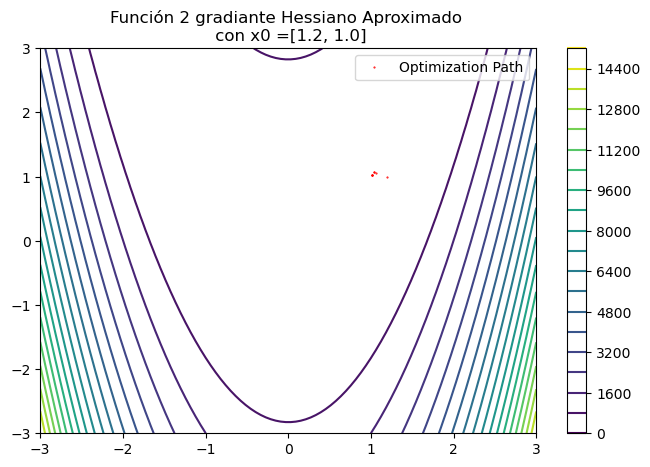

In [37]:
plot_function_2d(f_2, x_range=(-3, 3), y_range=(-3, 3), figsize=(8,5), show=True, 
                 points=results_4_b[1], title='Función 2 gradiante Hessiano Aproximado \n con x0 =[1.2, 1.0]')

#### Funcion c)

In [38]:
results_4_c = gradient_descent_with_approximate_hessian(f_3, df_3, ddf_3, f_3_initial_guess,
                                                         max_iterations=f_3_max_iterations, tolerance=f_3_tolerance)

Número de iteraciones = 1457 
El algoritmo SÍ convergió
Vector seleccionado: [1.00000406 1.00000818 1.00001612 1.00003228 1.00006471 1.00012968
 1.00025989 1.00052089 1.00104413 1.00209352]
Valor mínimo alcanzado: 1.4537873775931118e-06
Error mínimo alcanzado: 0.0015740405134333714


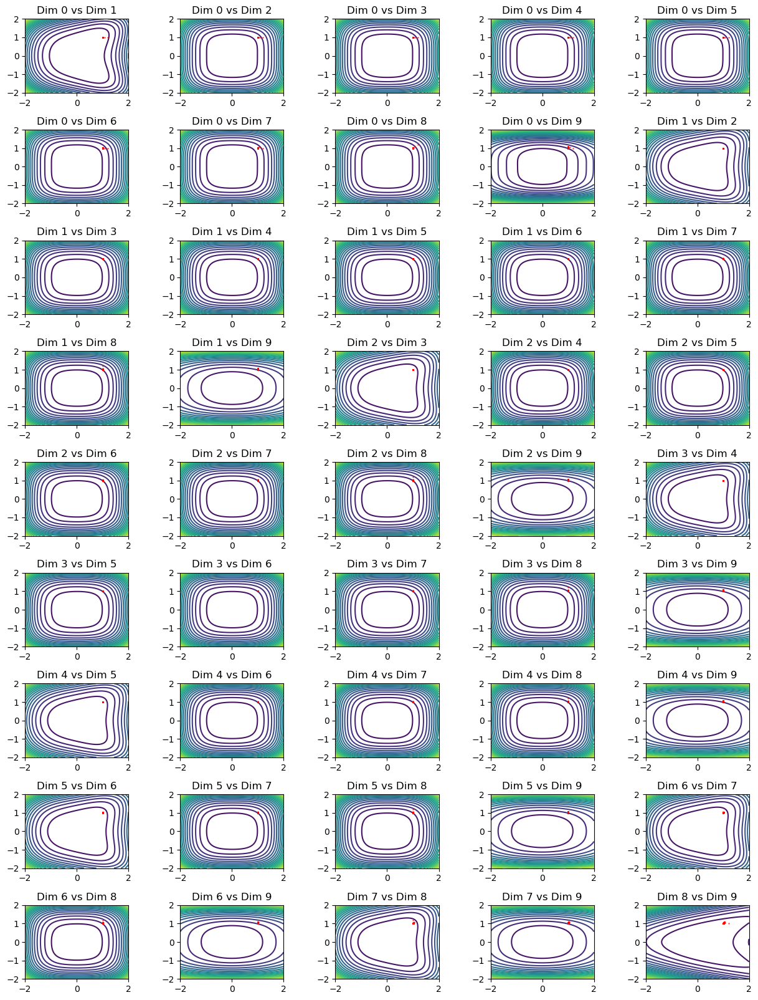

In [39]:
plot_function_10d(f_3, points=results_4_c[1])

### Algoritmo de descenso de Newton, con Hessiano exacto

#### Funcion a)

In [40]:
results_5_a = gradient_descent_with_exact_hessian(f_1, df_1, ddf_1, f_1_initial_guess, alpha=0.01, 
                                                         max_iterations=f_1_max_iterations, tolerance=f_1_tolerance)

Número de iteraciones = 1429 
El algoritmo SÍ convergió
Vector seleccionado: [-1.01462849 -1.04452318]
Valor mínimo alcanzado: -1.5113194473766325
Error mínimo alcanzado: 0.00010054245721357852


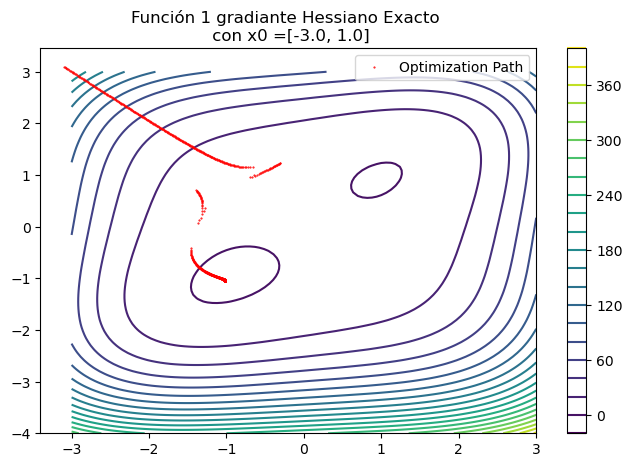

In [41]:
plot_function_2d(f_1, x_range=(-3, 3), y_range=(-4, 3), figsize=(8,5), show=True, 
                 points=results_5_a[1], title='Función 1 gradiante Hessiano Exacto \n con x0 =[-3.0, 1.0]')

#### Funcion b)

In [42]:
results_5_b = gradient_descent_with_exact_hessian(f_2, df_2, ddf_2, f_2_initial_guess, alpha=1,
                                                         max_iterations=f_2_max_iterations, tolerance=f_2_tolerance)

Número de iteraciones = 2 
El algoritmo SÍ convergió
Vector seleccionado: [1.00017686 1.00035376]
Valor mínimo alcanzado: 3.1281053442013894e-08
Error mínimo alcanzado: 17.45668231652831


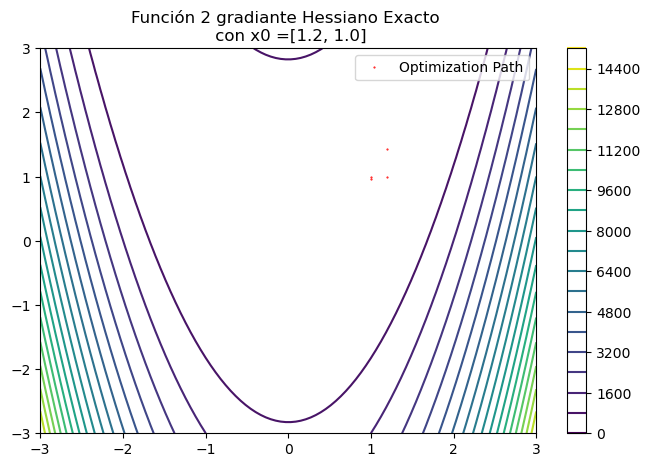

In [43]:
plot_function_2d(f_2, x_range=(-3, 3), y_range=(-3, 3), figsize=(8,5), show=True, 
                 points=results_5_b[1], title='Función 2 gradiante Hessiano Exacto \n con x0 =[1.2, 1.0]')

#### Funcion c)

In [44]:
results_5_c = gradient_descent_with_exact_hessian(f_3, df_3, ddf_3, f_3_initial_guess, alpha=0.00005,
                                                         max_iterations=f_3_max_iterations, tolerance=f_3_tolerance)

Número de iteraciones = 100000 
El algoritmo NO convergió
Vector seleccionado: [1.2 1.  1.  1.  1.  1.  1.  1.  1.2 1. ]
Valor mínimo alcanzado: 42.79999999999998
Error mínimo alcanzado: 139.7607313204734


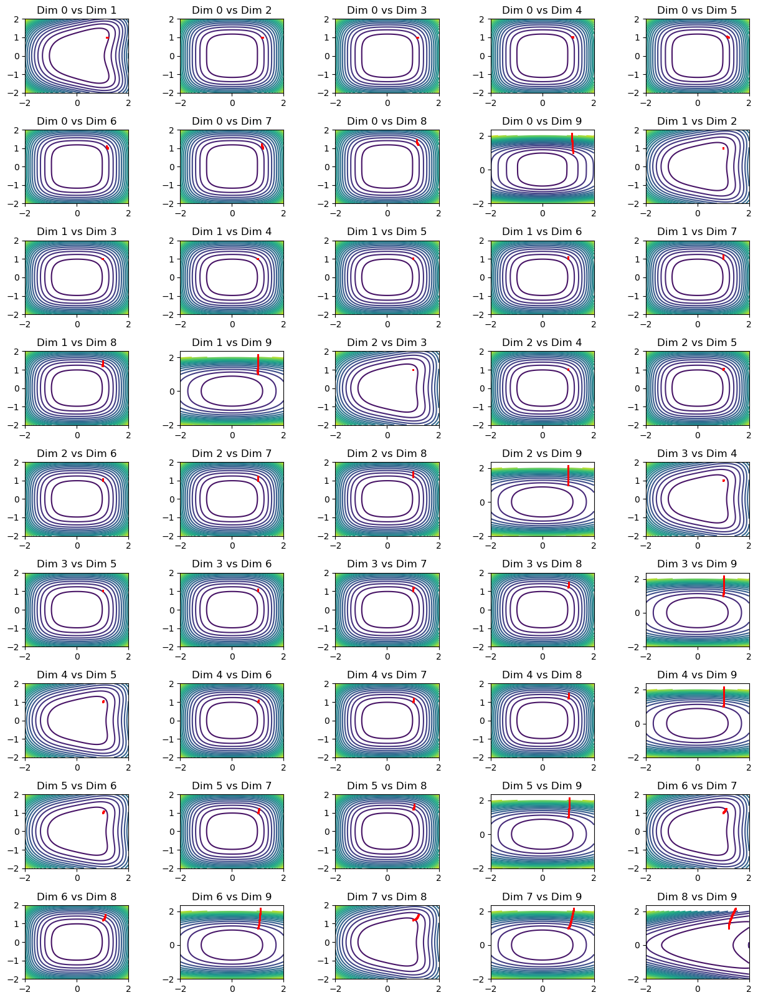

In [45]:
plot_function_10d(f_3, points=results_5_c[1])

### Algoritmo de gradiente conjugado Fletcher-Reeves

In [46]:
import numpy as np
import time

def conjugate_gradient_fletcher_reeves(f, df, x0, max_iterations=1000, tolerance=1e-4):
    start = time.time()

    x = x0
    iter = 0
    val = 'NO'
    best_x = x
    f_iter_seq = [x]
    f_x_iter_seq = [f(x)]
    error_seq = [np.linalg.norm(df(x))]

    gradient_k = df(x)
    d_k = -gradient_k

    while iter < max_iterations:
        alpha_k = np.dot(gradient_k, gradient_k) / np.dot(np.dot(df(x), d_k), d_k)

        x_next = x + alpha_k * d_k
        f_iter_seq.append(x_next)
        f_x_iter_seq.append(f(x_next))
        error_seq.append(np.linalg.norm(df(x_next)))

        beta_k = np.dot(df(x_next), df(x_next)) / np.dot(gradient_k, gradient_k)
        gradient_k = df(x_next)
        d_k = -gradient_k + beta_k * d_k

        if np.linalg.norm(df(x_next)) < tolerance:
            best_x = x_next
            val = 'SÍ'
            break

        x = x_next
        iter += 1

    print('Número de iteraciones = ' + str(iter), '\nEl algoritmo ' + val + ' convergió')
    print('Vector seleccionado: ' + str(best_x))
    print('Valor mínimo alcanzado: ' + str(f(best_x)))
    print('Error mínimo alcanzado: ' + str(error_seq[-1]))

    return best_x, f_iter_seq, f_x_iter_seq, error_seq, time.time() - start

# Example usage:
# result = conjugate_gradient_fletcher_reeves(my_function, my_gradient, initial_guess)


#### Funcion a)

In [47]:
results_6_a = conjugate_gradient_fletcher_reeves(f_1, df_1, f_1_initial_guess, f_1_max_iterations, f_1_tolerance)

Número de iteraciones = 50000 
El algoritmo NO convergió
Vector seleccionado: [-3.1  3.1]
Valor mínimo alcanzado: 225.69420000000002
Error mínimo alcanzado: 6326.438672067282


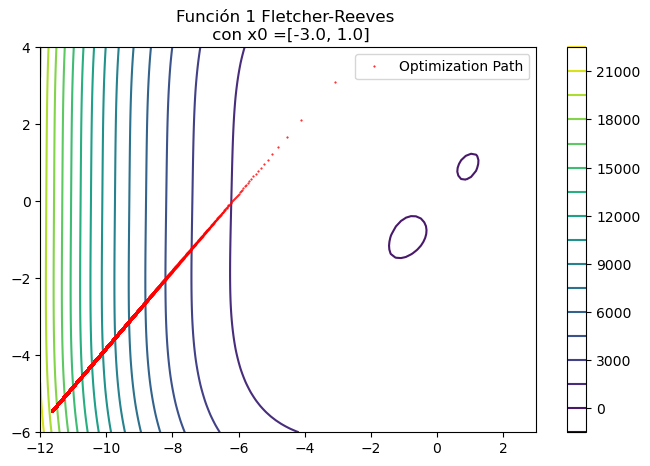

In [48]:
plot_function_2d(f_1, x_range=(-12, 3), y_range=(-6, 4), figsize=(8,5), show=True, 
                 points=results_6_a[1], title='Función 1 Fletcher-Reeves \n con x0 =[-3.0, 1.0]')

#### Funcion b)

In [49]:
results_6_b = conjugate_gradient_fletcher_reeves(f_2, df_2, f_2_initial_guess, f_2_max_iterations, f_2_tolerance)

Número de iteraciones = 100000 
El algoritmo NO convergió
Vector seleccionado: [1.2 1. ]
Valor mínimo alcanzado: 19.399999999999995
Error mínimo alcanzado: 87582.25302334482


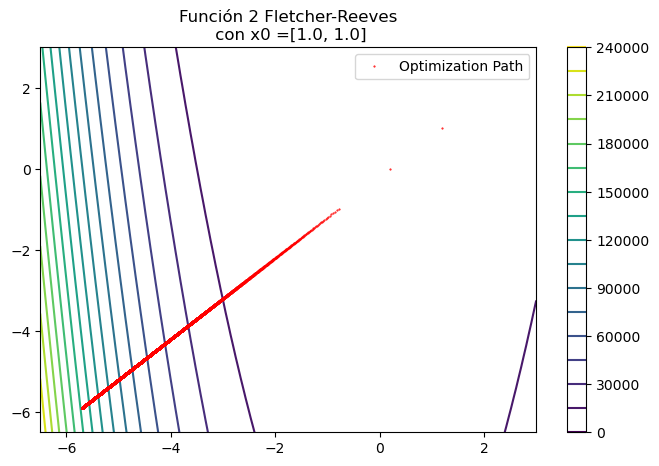

In [50]:
plot_function_2d(f_2, x_range=(-6.5, 3), y_range=(-6.5, 3), figsize=(8,5), show=True, points=results_6_b[1], title='Función 2 Fletcher-Reeves\n con x0 =[1.0, 1.0]')

#### Funcion c)

In [51]:
results_6_c = conjugate_gradient_fletcher_reeves(f_3, df_3, f_3_initial_guess, f_3_max_iterations, f_3_tolerance)

C:\Users\osjom\AppData\Local\Temp\ipykernel_7160\1465538783.py:19: RuntimeWarning: divide by zero encountered in divide
  alpha_k = np.dot(gradient_k, gradient_k) / np.dot(np.dot(df(x), d_k), d_k)
C:\Users\osjom\AppData\Local\Temp\ipykernel_7160\1465538783.py:21: RuntimeWarning: invalid value encountered in multiply
  x_next = x + alpha_k * d_k


Número de iteraciones = 100000 
El algoritmo NO convergió
Vector seleccionado: [1.2 1.  1.  1.  1.  1.  1.  1.  1.2 1. ]
Valor mínimo alcanzado: 42.79999999999998
Error mínimo alcanzado: nan


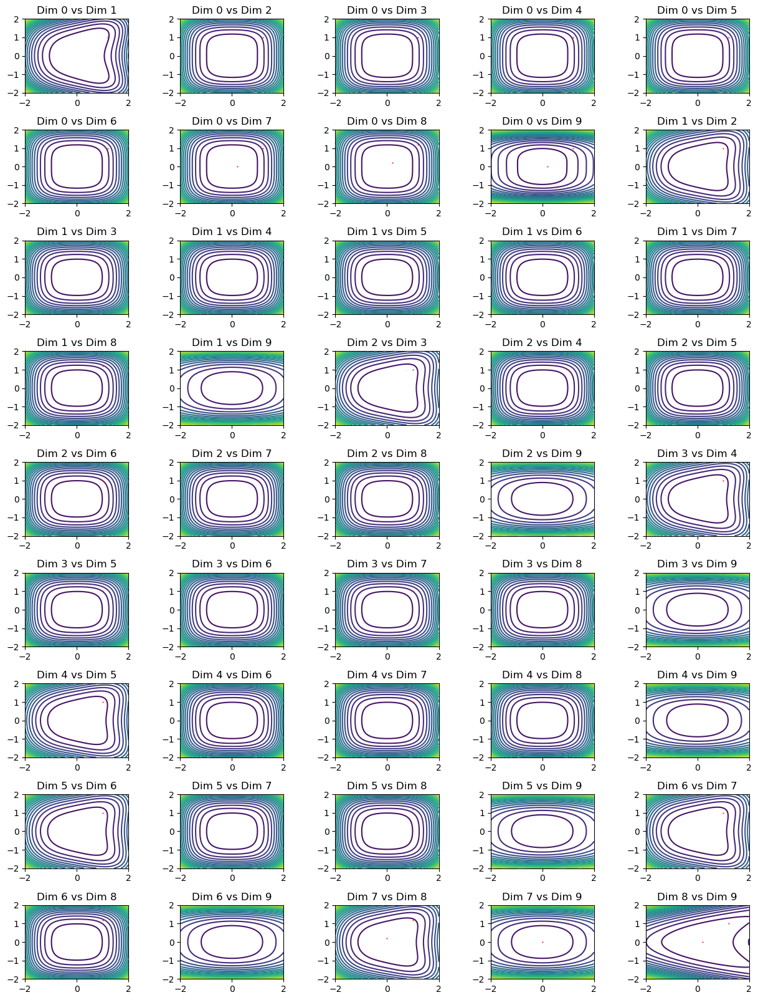

In [52]:
plot_function_10d(f_3, points=results_6_c[1])

### Algoritmo Quasi-Newton BFGS

#### Funcion a)

In [53]:
results_7_a = quasi_newton_bfgs(f_1, df_1, f_1_initial_guess, f_1_max_iterations, f_1_tolerance)

Número de iteraciones = 9 
El algoritmo SÍ convergió
Vector seleccionado: [0.98314492 0.95028564]
Valor mínimo alcanzado: -0.5121797144297824
Error mínimo alcanzado: 2.0021277610833583e-05


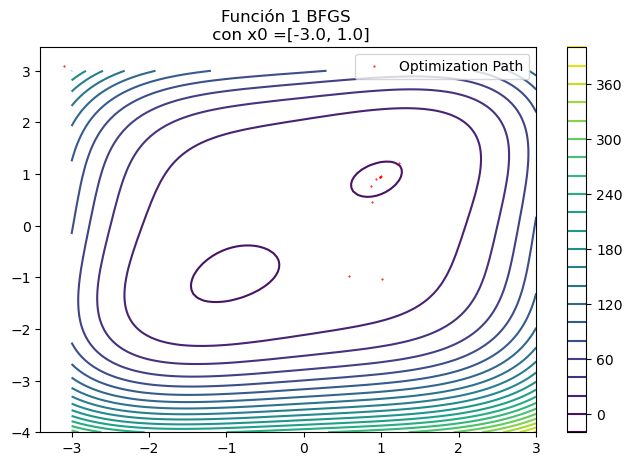

In [54]:
plot_function_2d(f_1, x_range=(-3, 3), y_range=(-4, 3), figsize=(8,5), show=True, 
                 points=results_7_a[1], title='Función 1 BFGS \n con x0 =[-3.0, 1.0]')

#### Funcion b)

In [55]:
results_7_b = quasi_newton_bfgs(f_2, df_2, f_2_initial_guess, f_2_max_iterations, f_2_tolerance)

Número de iteraciones = 11 
El algoritmo SÍ convergió
Vector seleccionado: [0.99999768 0.99999531]
Valor mínimo alcanzado: 5.578431639711448e-12
Error mínimo alcanzado: 1.4792741156723593e-05


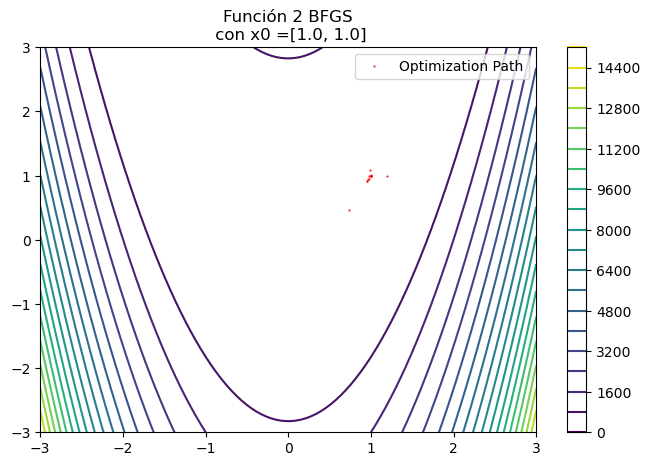

In [56]:
plot_function_2d(f_2, x_range=(-3, 3), y_range=(-3, 3), figsize=(8,5), show=True, points=results_7_b[1], title='Función 2 BFGS\n con x0 =[1.0, 1.0]')

#### Funcion c)

In [57]:
results_7_c = quasi_newton_bfgs(f_3, df_3, f_3_initial_guess, f_3_max_iterations, f_3_tolerance)

C:\Users\osjom\AppData\Local\Temp\ipykernel_7160\3169301331.py:30: RuntimeWarning: divide by zero encountered in scalar divide
  rho_k = 1.0 / np.dot(y_k, s_k)
C:\Users\osjom\AppData\Local\Temp\ipykernel_7160\3169301331.py:31: RuntimeWarning: invalid value encountered in multiply
  H_k = (np.eye(len(x)) - rho_k * np.outer(s_k, y_k)) @ H_k @ (np.eye(len(x)) - rho_k * np.outer(y_k, s_k)) + rho_k * np.outer(s_k, s_k)


Número de iteraciones = 100000 
El algoritmo NO convergió
Vector seleccionado: [1.2 1.  1.  1.  1.  1.  1.  1.  1.2 1. ]
Valor mínimo alcanzado: 42.79999999999998
Error mínimo alcanzado: nan


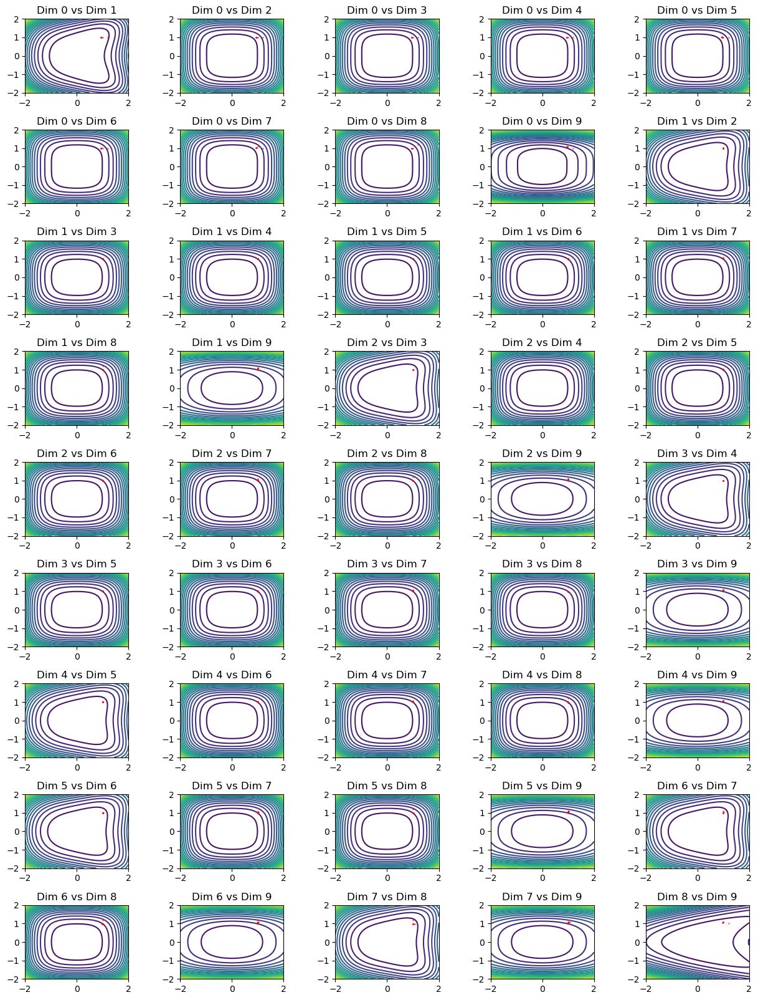

In [58]:
plot_function_10d(f_3, points=results_7_c[1])

### Resultados

#### Funcion a)

In [77]:
data_a = []
result_list = [results_1_a, results_2_a, results_3_a, results_4_a, results_5_a, results_6_a, results_7_a]

for i in range(len(result_list)):
    data_a.append(pd.DataFrame({
        'iteracion': range(len(result_list[i][3])),
        'metodo': [i + 1] * len(result_list[i][3]),
        'error': result_list[i][3],
        'time': result_list[i][4]
    }))

# Unimos los dataframes
data_a = pd.concat(data_a)

# Validamos la cantidad de itercione por metodo
data_a.metodo.value_counts()

1    50001
2    50001
6    50001
5     1431
3      308
4       19
7       11
Name: metodo, dtype: int64

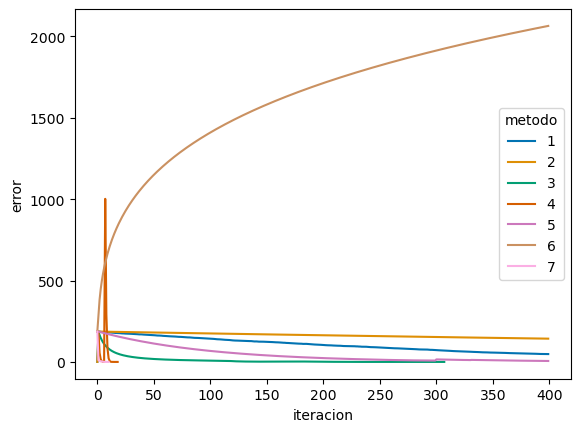

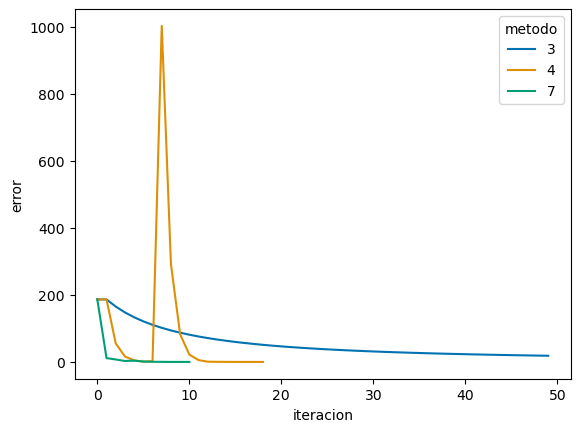

In [79]:
sns.lineplot(x='iteracion', y='error', hue='metodo', data=data_a[data_a.iteracion < 400], palette='colorblind')
plt.show()

sns.lineplot(x='iteracion', y='error', hue='metodo', data=data_a[(data_a.iteracion < 50) & data_a.metodo.isin([3, 4, 7])], palette='colorblind')
plt.show()

El mejor para la funcion a fue el metodo 7 BFGS, por lo que le gano a todos los metodos anteriores. EL metodo de Fetcher Reeves en cambio le fue muy mal

#### Funcion b)

In [80]:
data_b = []
result_list = [results_1_b, results_2_b, results_3_b, results_4_b, results_5_b, results_6_b, results_7_b]

for i in range(len(result_list)):
    data_b.append(pd.DataFrame({
        'iteracion': range(len(result_list[i][3])),
        'metodo': [i + 1] * len(result_list[i][3]),
        'error': result_list[i][3],
        'time': result_list[i][4]
    }))

# Unimos los dataframes
data_b = pd.concat(data_b)

# Validamos la cantidad de itercione por metodo
data_b.metodo.value_counts()

6    100001
2     23582
1      7166
3       427
7        13
4         8
5         4
Name: metodo, dtype: int64

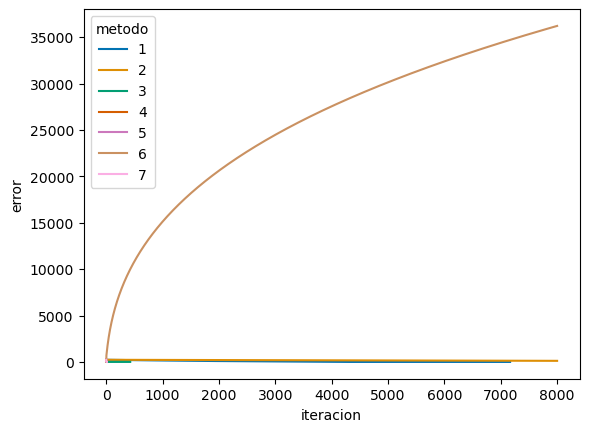

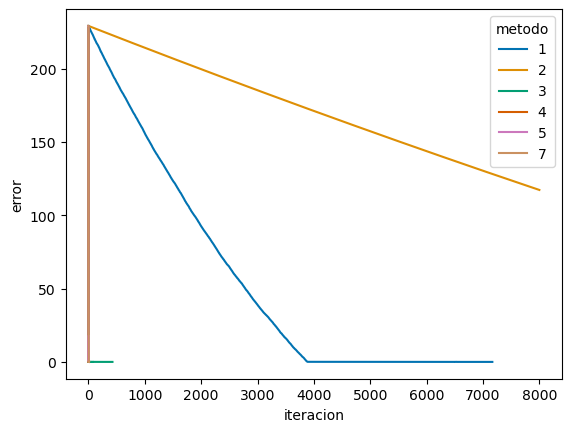

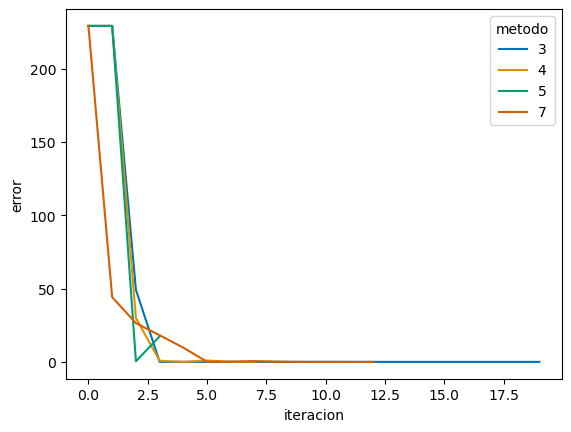

In [84]:
sns.lineplot(x='iteracion', y='error', hue='metodo', data=data_b[data_b.iteracion < 8000], palette='colorblind')
plt.show()

sns.lineplot(x='iteracion', y='error', hue='metodo', data=data_b[(data_b.metodo != 6) & (data_b.iteracion < 8000)], palette='colorblind')
plt.show()

sns.lineplot(x='iteracion', y='error', hue='metodo', data=data_b[data_b.metodo.isin([4,5,7,3]) & (data_b.iteracion < 20)], palette='colorblind')
plt.show()

El mejor fue el metodo 5, aunque el 4 tambien fue muy eficiente. EL metodo BFGS tambien le fue bien en converger olo en 13 iteraciones, mientras que el fletcher reeves le fue mal otra vez.

#### Funcion c)

In [101]:
data_c = []
result_list = [results_1_c, results_2_c, results_3_c, results_4_c, results_5_c, results_6_c, results_7_c]

for i in range(len(result_list)):
    data_c.append(pd.DataFrame({
        'iteracion': range(len(result_list[i][3])),
        'metodo': [i + 1] * len(result_list[i][3]),
        'error': result_list[i][3],
        'time': result_list[i][4]
    }))

# Unimos los dataframes
data_c = pd.concat(data_c, ignore_index=True)

# Validamos la cantidad de itercione por metodo
data_c.metodo.value_counts()

2    100001
5    100001
6    100001
7    100001
1     88607
3      9036
4      1459
Name: metodo, dtype: int64

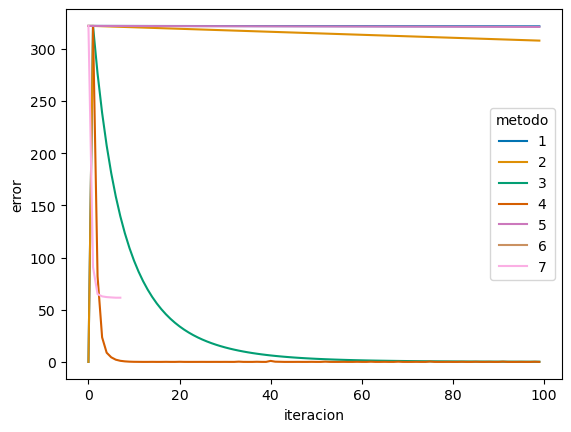

In [104]:
sns.lineplot(x='iteracion', y='error', hue='metodo', data=data_c[data_c.iteracion < 100], palette='colorblind')
plt.show()

EL mejor metodo es el 4. BFGS se queda perdidoen un punto, mientras que Fletcher Reevees empiez muy bien, pero no logra pasar la tolerancia.

## Ejercicio 3

## Ejercicio 4

In [83]:
class GeneticTSPSolver:
    def __init__(self, population_size=50, mutation_rate=0.1, top_n_proportion=0.2, child_proportion=0.5, mutation_child_proportion=0.5, population_proportion=0.8):
        self.population_size = population_size
        self.mutation_rate = mutation_rate
        self.top_n_proportion = top_n_proportion
        self.child_proportion = child_proportion
        self.mutation_child_proportion = mutation_child_proportion
        self.population_proportion = population_proportion

        # Attributes to store results
        self.best_solution = None
        self.best_distance = np.inf
        self.best_paths = []
        self.data = None
        self.generation = 0

    def euclidean_distance(self, city1, city2):
        return np.sqrt((city1['lat'] - city2['lat'])**2 + (city1['lon'] - city2['lon'])**2)

    def total_distance(self, permutation):
        distance = 0
        for i in range(len(permutation) - 1):
            distance += self.euclidean_distance(self.data.iloc[permutation[i]], self.data.iloc[permutation[i + 1]])
        distance += self.euclidean_distance(self.data.iloc[permutation[-1]], self.data.iloc[permutation[0]])
        return distance

    def fitness(self, population):
        scores = []
        for ind in population:
            scores.append(self.total_distance(ind))
        return np.array(scores)

    def reproduce(self, parent1, parent2):
        n = len(parent1)
        child = [-1] * n
        start, end = sorted(np.random.choice(n, 2, replace=False))

        child[start:end + 1] = parent1[start:end + 1]

        unused_cities = [city for city in parent2 if city not in child]
        current_idx = end + 1
        for gene in unused_cities:
            if -1 in child:
                while child[current_idx % n] != -1:
                    current_idx += 1
                child[current_idx % n] = gene
                current_idx += 1

        return child

    def mutate(self, child, mutation_rate=2):
        indices_to_mutate = np.random.choice(len(child), mutation_rate, replace=False)
        mutated_child = child.copy()

        for i in range(0, len(indices_to_mutate), 2):
            mutated_child[indices_to_mutate[i]], mutated_child[indices_to_mutate[i + 1]] = \
                mutated_child[indices_to_mutate[i + 1]], mutated_child[indices_to_mutate[i]]

        return mutated_child

    def select(self, scores, num_to_select):
        indices = np.argsort(scores)[:num_to_select]
        return indices

    def fit(self, df, generations=50):
        self.data = df
        n_cities = len(self.data)
        population_size = self.population_size
        top_n_size = int(population_size * self.top_n_proportion)
        child_size = int(population_size * self.child_proportion)
        mutation_child_size = int(child_size * self.mutation_child_proportion)

        population = [list(np.random.permutation(n_cities)) for _ in range(population_size)]

        for generation in range(generations):
            scores = self.fitness(population)
            top_n_indices = self.select(scores, top_n_size)

            next_generation = [population[i] for i in top_n_indices]

            for _ in range(child_size - mutation_child_size):
                parent1, parent2 = np.random.choice(top_n_indices, 2, replace=False)
                child = self.reproduce(population[parent1], population[parent2])
                next_generation.append(child)

            for _ in range(mutation_child_size):
                parent = np.random.choice(top_n_indices)
                mutated_child = self.mutate(population[parent], mutation_rate=2)
                next_generation.append(mutated_child)

            while len(next_generation) < population_size:
                next_generation.append(list(np.random.permutation(n_cities)))

            population = next_generation
            
            gen_best_solution = population[np.argsort(scores)[0]]
            gen_best_distance = self.total_distance(gen_best_solution)
            
            if gen_best_distance < self.best_distance:
                self.best_solution = gen_best_solution
                self.best_distance = gen_best_distance
            
            self.best_paths.append(self.best_solution)
            
            self.generation += 1

    def plot_best_path(self):
        if self.best_solution is not None:
            plt.figure(figsize=(8, 6))
            plt.scatter(self.data['lat'], self.data['lon'], c='blue', marker='o', label='Cities')
            plt.plot(self.data.iloc[self.best_solution]['lat'], self.data.iloc[self.best_solution]['lon'], c='red', linestyle='-', marker='o', label='Best Path')
            plt.title('Best Path for TSP')
            plt.xlabel('Latitude')
            plt.ylabel('Longitude')
            plt.legend()
            plt.show()
        else:
            print("No solution found. Please run the 'fit' method first.")

    def plot_cities(self):
        plt.figure(figsize=(8, 6))
        plt.scatter(self.data['lat'], self.data['lon'], c='blue', marker='o')
        plt.title('City Coordinates')
        plt.xlabel('Latitude')
        plt.ylabel('Longitude')
        plt.show()
        
    def create_gif(self, gif_filename, duration=0.1):
        images = []
        for path in self.best_paths:
            plt.figure(figsize=(8, 6))
            plt.scatter(self.data['lat'], self.data['lon'], c='blue', marker='o', label='Cities')
            plt.plot(self.data.iloc[path]['lat'], self.data.iloc[path]['lon'], c='red', linestyle='-', marker='o', label='Best Path')
            plt.title('Best Path for TSP (Generation {})'.format(len(images)))
            plt.xlabel('Latitude')
            plt.ylabel('Longitude')
            plt.legend()

            # Save the image to bytes
            buf = io.BytesIO()
            plt.savefig(buf, format='png')
            buf.seek(0)
            images.append(imageio.imread(buf))
            plt.close()

        # Save the GIF
        imageio.mimsave(gif_filename, images, duration=duration)
        print("GIF saved as:", gif_filename)

In [84]:
cities_df = pd.read_csv('cities.csv', sep=';', names=['lat', 'lon'], header=None)
cities_df.head()

,lat,lon
0,9.84,0.45
1,4.13,2.60
2,6.10,1.29
3,6.21,2.27
4,5.05,5.26


Best Solution (City Order): [2, 22, 23, 13, 14, 5, 6, 20, 7, 16, 18, 9, 17, 10, 8, 19, 12, 11, 4, 24, 21, 1, 15, 3, 0]
Total Distance: 43.676239322831606


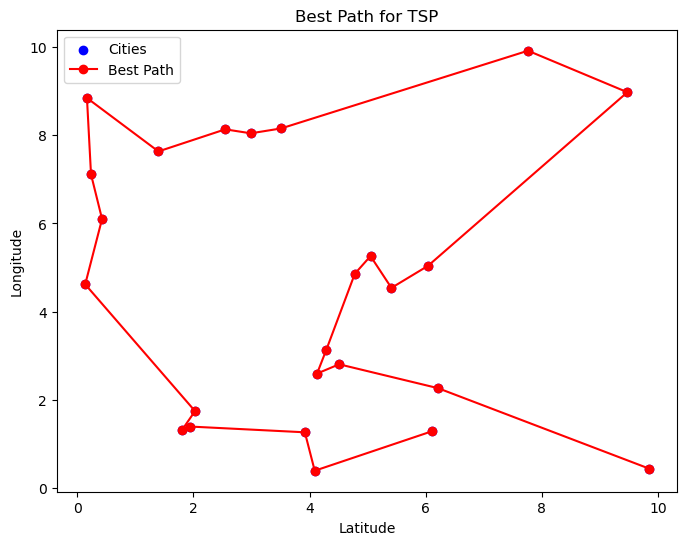

In [85]:
solver = GeneticTSPSolver(population_size=100)

solver.fit(cities_df, generations=100)

print("Best Solution (City Order):", solver.best_solution)
print("Total Distance:", solver.best_distance)

solver.plot_best_path()

In [86]:
solver.create_gif('tsp gif.gif')

C:\Users\osjom\AppData\Local\Temp\ipykernel_14000\3579513970.py:143: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(buf))


GIF saved as: tsp gif.gif
